In [1]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-

## authorship information
__author__ = "Alex Tavkhelidze"<br>
__credits__ = ["Bernd Brinkmann", "Luigi Menale", "Arif Haidari", "Romain Lesieur"]<br>
__email__ = <a href="mailto:&#106;&#101;&#111;&#115;&#064;&#109;&#097;&#105;&#108;&#046;&#099;&#111;&#109;">jeos [at] mail [dot] com</a><br>
__status__ = "Development"<br>
__project__ = "Plant Recognition"<br>
__scope__ = "DataScientest's Bootcamp in Data Science"

#### materials used besides own contribution:
https://keras.io/examples/vision/grad_cam/<br>
https://towardsdatascience.com/interpreting-cnn-models-a11b1f720097<br>
https://stackoverflow.com/questions/50151157/keras-how-to-get-layer-index-when-already-know-layer-name

In [ ]:
"""Implements and executes the visual/interpretability analysis pipeline for the team's best-performing CNN model:
   prediction performance on the random sample of images from the web, test & validation sets
   visualization of feature maps
   Grad-CAM (Gradient-weighted Class Activation Maps)
   Guided Grad-CAM (interplay of Guided Backpropagation-derived saliency maps & Grad-CAM heatmaps)
"""

In [3]:
import os
import multiprocessing

from PIL import Image
import numpy as np
import tensorflow as tf
from tensorflow.python.client import device_lib
from keras.preprocessing import image
import keras_cv
import cv2
import matplotlib.patches as patches
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
# checks whether GPU(s) is(are) supported: if supported, the output will contain entries with "GPU"
# TODO: in case GPU is not supported, make sure GPU usage is activated
# [e.g. for Google Colab: Menu->Laufzeit->Laufzeittyp ändern-> Hardwarebeschleuniger -> (T4) GPU]
print("GPU not available/supported" if "GPU" not in device_lib.list_local_devices() else device_lib.list_local_devices())
print()
# displays the number of online CPUs
num_of_cpu_cores = multiprocessing.cpu_count()
print("# of CPU cores:",num_of_cpu_cores)

GPU not available/supported

# of CPU cores: 16


In [5]:
# TODO: replace the arguments with your full path directory names - TODO: for Unix systems, erase the first argument

# assuming 'dir6' is the main directory containing all the class-representing folders with respective image files
dataset_dir = os.path.join("C:",os.sep,"Users","username","dir1","dir2","dir3","dir4","dir5","dir6")

# defining the path for loading the saved (Keras) model:
path_to_saved_model_BeLu = os.path.join("C:",os.sep,"Users","username","dir1_","dir2_","dir3_","dir4_","dir5_", "TL_180px_32b_20e_model.keras")

In [6]:
# preprocesses and extracts the testing & validation set of images used for testing the performance of the team's best model

# must be same as used for training the target model
seed_train_validation = 123 
validation_split = 0.2
batch_size = 32
buffer_size = num_of_cpu_cores # other possibilities: '= batch_size' or universally '= tf.data.AUTOTUNE'
image_size = (180, 180)

test_val_ds = tf.keras.utils.image_dataset_from_directory(
directory = dataset_dir,
image_size = image_size,
validation_split = validation_split,
subset = "validation",
seed = seed_train_validation,
batch_size = batch_size)
class_names = test_val_ds.class_names
n_img_labels = len(test_val_ds.class_names)
test_val_ds_file_paths = test_val_ds.file_paths
n_img = len(test_val_ds_file_paths)
n_btch = test_val_ds.cardinality().numpy()
test_val_ds = test_val_ds.prefetch(buffer_size=buffer_size)
print("Classes to predict (in the validation & test set) -->", n_img_labels)
print("Images (in the validation & test set) -->", n_img)
print('Batches for validating (validation & test set) -->', n_btch)

Found 60987 files belonging to 51 classes.
Using 12197 files for validation.
Classes to predict (in the validation & test set) --> 51
Images (in the validation & test set) --> 12197
Batches for validating (validation & test set) --> 382


In [8]:
# loading the target (Keras) model
model_BeLu = tf.keras.models.load_model(path_to_saved_model_BeLu)

In [9]:
# plotting the architecture of the loaded (Keras) model
print("augmentation-free, pre-trained & fine-tuned MobileNetV2 model summary:")
model_BeLu.summary()

augmentation-free, pre-trained & fine-tuned MobileNetV2 model summary:


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 6, 6, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 51)             │        65,331 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,250,088 (16.21 MB)

 Trainable params: 1,926,771 (7.35 MB)

 Non-trainable params: 396,544 (1.51 MB)

 Optimizer params: 1,926,773 (7.35 MB)

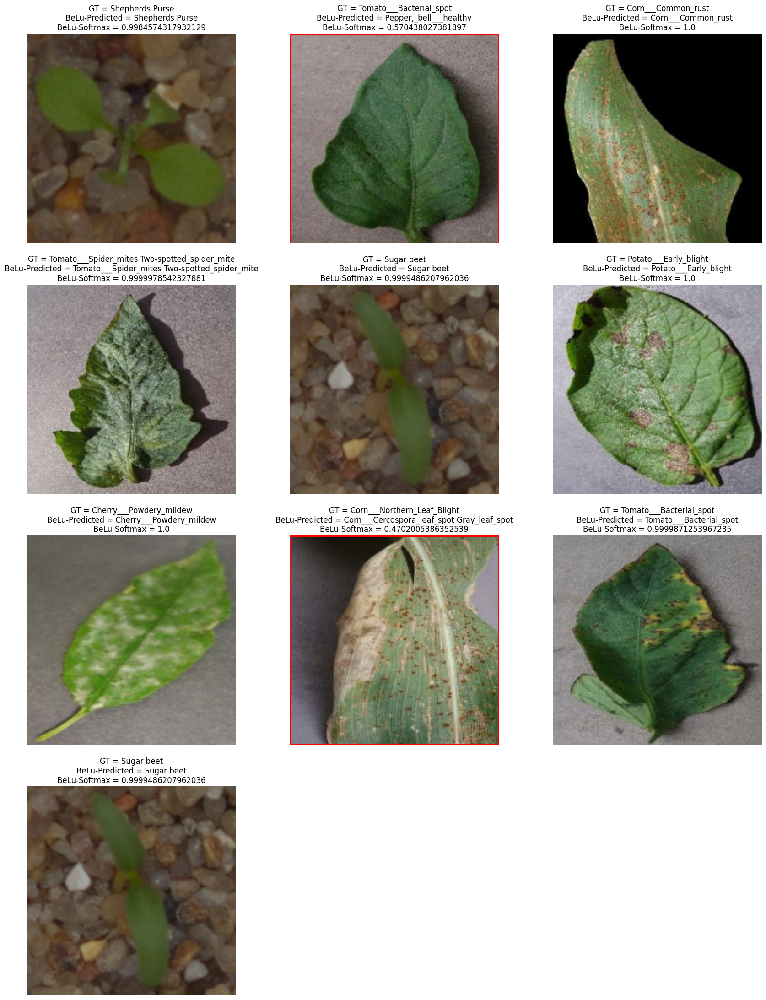

In [10]:
# predicts on the partition of randomly chosen 1st batch of the test & validation data, 
# and plots the grid of images with performance details shown in titles

n_cols_sbplt = np.minimum(int(np.sqrt(batch_size)),3)
n_rows_sbplt = int(batch_size/n_cols_sbplt)
n_sbplts = int(n_rows_sbplt * n_cols_sbplt /3)
i_sbplt = 1
# n_trues = int(n_sbplts * 0.7)
# c_trues = 0
# acc_test_BeLu = 0.97
# boost_fct = 4
n_btchs = 1 # for other than exceptionally well performing models: boost_fct * int((n_sbplts - n_trues)/(1 - acc_test_BeLu)/batch_size + 1)

test_val_ds_unbtch = test_val_ds.shuffle(n_btch, reshuffle_each_iteration=False).take(n_btchs).\
  map(lambda img, lbl: (img, lbl, model_BeLu(img, training=False)), num_parallel_calls=buffer_size).unbatch()

plt.figure(figsize=(7*n_cols_sbplt, 7*n_rows_sbplt))

while i_sbplt <= n_sbplts:
  img, lbl, pr_lbl_BeLu = next(iter(test_val_ds_unbtch))
  pred_lbl_BeLu = np.argmax(pr_lbl_BeLu.numpy(), axis = -1)
  pred_max_BeLu = pr_lbl_BeLu.numpy()[pred_lbl_BeLu]
  GT_idx = lbl.numpy()
  # for other than best models:
  #if (GT_idx == pred_lbl_BeLu):
  #  if c_trues == n_trues:
  #    continue
  #  c_trues +=1
  plt.subplot(n_rows_sbplt,n_cols_sbplt, i_sbplt)
  plt.imshow(img.numpy()/255., interpolation = "bilinear")
  plt.axis("off")
  plt.title(f"GT = {class_names[GT_idx]}\nBeLu-Predicted = {class_names[pred_lbl_BeLu]}\nBeLu-Softmax = {pred_max_BeLu}")
  if GT_idx != pred_lbl_BeLu:
    plt.gca().add_patch(patches.Rectangle((0, 0), 180, 180, linewidth=3, ls = '-', edgecolor='r', facecolor='none'))
  i_sbplt +=1

plt.show();plt.close();

371167/371167 ━━━━━━━━━━━━━━━━━━━━ 1s 3us/step
374024/374024 ━━━━━━━━━━━━━━━━━━━━ 1s 3us/step
309393/309393 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
132420/132420 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
473756/473756 ━━━━━━━━━━━━━━━━━━━━ 0s 1us/step
96088/96088 ━━━━━━━━━━━━━━━━━━━━ 0s 2us/step
185041/185041 ━━━━━━━━━━━━━━━━━━━━ 0s 2us/step
83814/83814 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
31855/31855 ━━━━━━━━━━━━━━━━━━━━ 0s 3us/step
870821/870821 ━━━━━━━━━━━━━━━━━━━━ 0s 1us/step


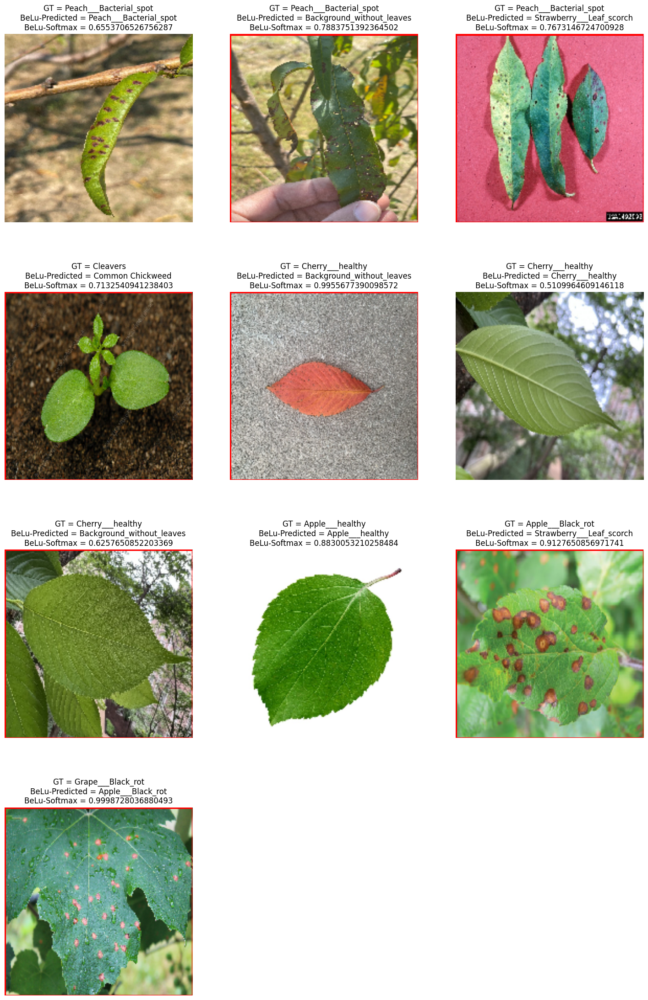

In [18]:
# downloads -> loads -> preprocesses -> retrieves the best model's predictions -> shows GT-labeled images from the web

# TODO: replace the arguments with your full path directory names - TODO: for Unix systems, erase the first argument
dataset_web_dir = os.path.join("C:",os.sep,"Users","username","dir1__","dir2__","dir3__","dir4__","dir5__","dir6__")

img_web_url_lst = [
"https://www.aces.edu/wp-content/uploads/2023/01/Bacterial-Spot-on-Peach-Leaf.jpg",
"https://www.aces.edu/wp-content/uploads/2023/01/Bacterial-Spot-on-Peach-Leaf-Photo-2-scaled.jpg",
"https://cdn.mos.cms.futurecdn.net/AA8tPA7mq5RNPw2J3rT3VH-1600-80.jpg",
"https://media.sciencephoto.com/image/c0065348/800wm/C0065348-Cleavers_seedling.jpg",
"https://bpb-us-w2.wpmucdn.com/sites.wustl.edu/dist/6/1300/files/2023/03/AW4_LeafFall_Nove2022_SS-1536x1152.jpg",
"https://bpb-us-w2.wpmucdn.com/sites.wustl.edu/dist/6/1300/files/2022/07/IMG-9690-1024x833.jpg",
"https://bpb-us-w2.wpmucdn.com/sites.wustl.edu/dist/6/1300/files/2022/07/IMG-9689-1024x768.jpg",
"https://img.freepik.com/premium-photo/green-apple-leaf-isolated-white-background-one-fresh-young-leaf_92795-1585.jpg",
"https://www.ontario.ca/files/2022-07/omafra-black-rot-figure-1-en-400x308-2022-07-21-v1.jpg",
"https://kentuckypestnews.wordpress.com/wp-content/uploads/2016/07/black-rot-of-grape_figure-1.jpg"
]

img_web_lbl_lst = [
"Peach___Bacterial_spot",
"Peach___Bacterial_spot",
"Peach___Bacterial_spot",
"Cleavers",
"Cherry___healthy",
"Cherry___healthy",
"Cherry___healthy",
"Apple___healthy",
"Apple___Black_rot",
"Grape___Black_rot"
]

n_img_web = len(img_web_url_lst)
assert len(img_web_lbl_lst) == n_img_web

img_web_path_lst = []
delmt = "__"
img_web_name_iter = iter(range(n_img_web))
for lbl, url in zip(img_web_lbl_lst,img_web_url_lst):
  img_web_path_lst.append(os.path.join(dataset_web_dir,lbl, delmt+str(next(img_web_name_iter))+url[url.rfind('.'):]))

n_cols_web_sbplt = 3
n_rows_web_sbplt = int(np.ceil(n_img_web/n_cols_web_sbplt))

plt.figure(figsize =(6*n_cols_web_sbplt, 7*n_rows_web_sbplt))

for i, (img_web_path, img_web_url, img_web_lbl) in enumerate(zip(img_web_path_lst, img_web_url_lst, img_web_lbl_lst)):
  img_path = tf.keras.utils.get_file(fname=img_web_path, # FIXME: does not work (for Windows OS machines), still saves in the Keras cache directory
                                     origin=img_web_url)
  img = image.load_img(img_path, 
                     target_size=image_size,
                     keep_aspect_ratio=False)
  os.remove(img_path) # cleares cache from the file - otherwise saves files to 'C:\Users\username\.keras\datasets' (for Windows OS machines)
  img_arr = image.img_to_array(img)

  GT_lbl = img_web_lbl
  pred_vec_BeLu = model_BeLu(tf.expand_dims(img_arr, axis=0), training=False)
  pred_lbl_idx_BeLu = np.argmax(pred_vec_BeLu, axis=-1)[0]
  pred_max_BeLu = np.max(pred_vec_BeLu)
  pred_lbl_BeLu = class_names[pred_lbl_idx_BeLu]

  plt.subplot(n_rows_web_sbplt, n_cols_web_sbplt, i+1)
  plt.imshow(img_arr/255., interpolation = "bilinear")
  plt.axis("off")
  plt.title(f"GT = {GT_lbl}\nBeLu-Predicted = {pred_lbl_BeLu}\nBeLu-Softmax = {pred_max_BeLu}")
  if GT_lbl != pred_lbl_BeLu:
    plt.gca().add_patch(patches.Rectangle((0, 0), 180, 180, linewidth=3, ls = '-', edgecolor='r', facecolor='none'))

plt.show();plt.close();


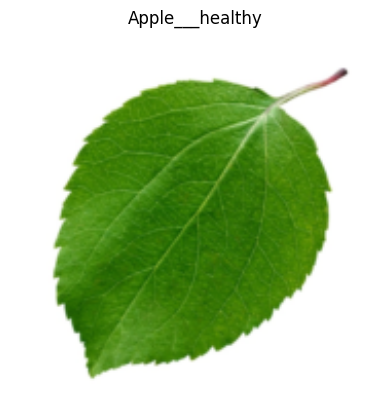

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 682ms/step


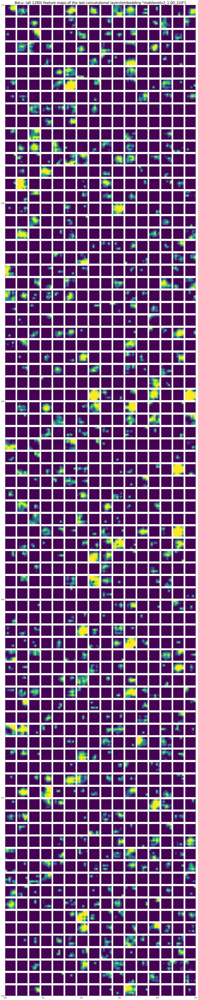

In [61]:
# visualizing (all) feature maps of the last convolutional layer of the target (Keras) model on the example of a sample image

img_path = tf.keras.utils.get_file(
    "Apple___healthy",
    "https://img.freepik.com/premium-photo/green-apple-leaf-isolated-white-background-one-fresh-young-leaf_92795-1585.jpg"
)
img = image.load_img(img_path, 
                     target_size=image_size,
                     interpolation="bilinear",
                     keep_aspect_ratio=False)

img_arr = image.img_to_array(img)

plt.axis("off")
plt.imshow(img_arr/255., interpolation="bilinear")
plt.title("Apple___healthy")
plt.show();plt.close();

input_shape = image_size + (3,)

def getLayerIndexByName(model, layername):
    for idx, layer in enumerate(model.layers):
        if layer.name == layername:
            return idx

bis = getLayerIndexByName(model_BeLu, "mobilenetv2_1.00_224")
top = len(model_BeLu.layers)
inputs = tf.keras.Input(input_shape)
x = inputs
last_conv_output = model_BeLu.get_layer("mobilenetv2_1.00_224")(x)
x = last_conv_output
for idx in range(bis+1,top):
    x = model_BeLu.layers[idx](x)
output = x
model_BeLu_redef = tf.keras.Model(inputs, last_conv_output)

img = tf.expand_dims(img_arr, axis=0)
feature_maps_BeLu = model_BeLu_redef.predict(img)

n_ft_maps_BeLu = model_BeLu.get_layer("mobilenetv2_1.00_224").output_shape[-1]

fig = plt.figure(figsize =(1*16, 1*80))
plt.title(f'BeLu: (all {n_ft_maps_BeLu}) feature maps of the last convolutional layer/(embedding "mobilenetv2_1.00_224")', fontsize=20)
for i in range(n_ft_maps_BeLu):
	plt.subplot(80, 16, i+1)
	plt.axis("off")
	plt.imshow(feature_maps_BeLu[0][:, :, i], interpolation="bilinear")
plt.tight_layout()
plt.show();plt.close();

In [11]:
# implementation of the entire (Guided) Grad-CAM interpretability environment procedure

LAST_2D_LAYER_NAME_BeLu = 'mobilenetv2_1.00_224'
input_shape = image_size + (3,)
#----------------------------------------------------------------------------
def getLayerIndexByName(model, layername):
    for idx, layer in enumerate(model.layers):
        if layer.name == layername:
            return idx
#----------------------------------------------------------------------------        
def make_gradcam_heatmap(img, model, LAST_2D_LAYER_NAME):
    model.layers[-1].activation = None
    # rebuilding of (model graph) dependencies for the gradient computation
    bis = getLayerIndexByName(model, LAST_2D_LAYER_NAME)
    top = len(model.layers)
    inputs = tf.keras.Input(input_shape)
    x = inputs
    last_conv_output = model.get_layer(LAST_2D_LAYER_NAME)(x)
    x = last_conv_output
    for idx in range(bis+1,top):
        x = model.layers[idx](x)
    output = x
    grad_model = tf.keras.Model(inputs, [last_conv_output, output])

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img, training=False)
        class_channel = preds[:, tf.argmax(preds[0])]
    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the output class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()
#----------------------------------------------------------------------------
#----------------------------------------------------------------------------
# producing Guided Grad-CAM visualizations of input images

@tf.custom_gradient
def guided_relu(x):
    # guided version of relu which lets back only postive gradients in backpropogation
    def grad(dy):
        return tf.cast(dy > 0, "float32") * tf.cast(x > 0, "float32") * dy

    return tf.nn.relu(x), grad
#----------------------------------------------------------------------------
class GuidedBackprop:
    def __init__(self, model):
        self.model = model
        self.gb_model = self.build_guided_model()

    def build_guided_model(self):
        # build a guided version of the model replace ReLU with guided ReLU
        gb_model = tf.keras.Model(
            self.model.inputs, self.model.layers[-1].output
        )
        layers = [
            layer for layer in gb_model.layers[1:] if hasattr(layer, "activation")
        ]
        for layer in layers:
            if layer.activation == tf.keras.activations.relu:
                layer.activation = guided_relu
        return gb_model

    def guided_backprop(self, image: np.ndarray, lbl: int):
        with tf.GradientTape() as tape:
            inputs = tf.cast(image, tf.float32)
            tape.watch(inputs)
            outputs = self.gb_model(inputs, training=False)
            expected_output = tf.one_hot([lbl], n_img_labels)
            loss = tf.keras.losses.categorical_crossentropy(
                expected_output, outputs
            )
        # get the gradient of the loss with respect to the input image
        grads = tape.gradient(loss, inputs)[0]
        return grads
#----------------------------------------------------------------------------
def get_saliency_map(img, lbl, model):
    gb = GuidedBackprop(model)

    saliency_map = gb.guided_backprop(img, lbl).numpy()

    # Normalize with mean 0 and std 1
    saliency_map -= saliency_map.mean()
    saliency_map /= saliency_map.std() + tf.keras.backend.epsilon()
    # Change mean to 0.5 and std to 0.25
    saliency_map *= 0.25
    saliency_map += 0.5
    # Clip values between 0 and 1
    saliency_map = np.clip(saliency_map, 0, 1)
    # Change values between 0 and 255
    saliency_map *= (2 ** 8) - 1
    saliency_map = saliency_map.astype(np.uint8)
    return saliency_map
#----------------------------------------------------------------------------
def get_guided_gradcam(img, lbl, model, LAST_2D_LAYER_NAME):    
    gb = GuidedBackprop(model)

    # Guided grad_cam is guided backpropogation with feature importance coming from grad-cam
    saliency_map = gb.guided_backprop(img, lbl).numpy()
    gradcam = cv2.resize(make_gradcam_heatmap(img, model, LAST_2D_LAYER_NAME), image_size)
    gradcam = np.clip(gradcam, 0, np.max(gradcam)) / np.max(gradcam)
    guided_gradcam = saliency_map * np.repeat(gradcam[..., np.newaxis], 3, axis=2)

    # Normalize
    guided_gradcam -= guided_gradcam.mean()
    guided_gradcam /= guided_gradcam.std() + tf.keras.backend.epsilon()
    guided_gradcam *= 0.25
    guided_gradcam += 0.5
    guided_gradcam = np.clip(guided_gradcam, 0, 1)
    guided_gradcam *= (2 ** 8) - 1
    guided_gradcam = guided_gradcam.astype(np.uint8)
    return guided_gradcam

._._._._|_._._._._|_

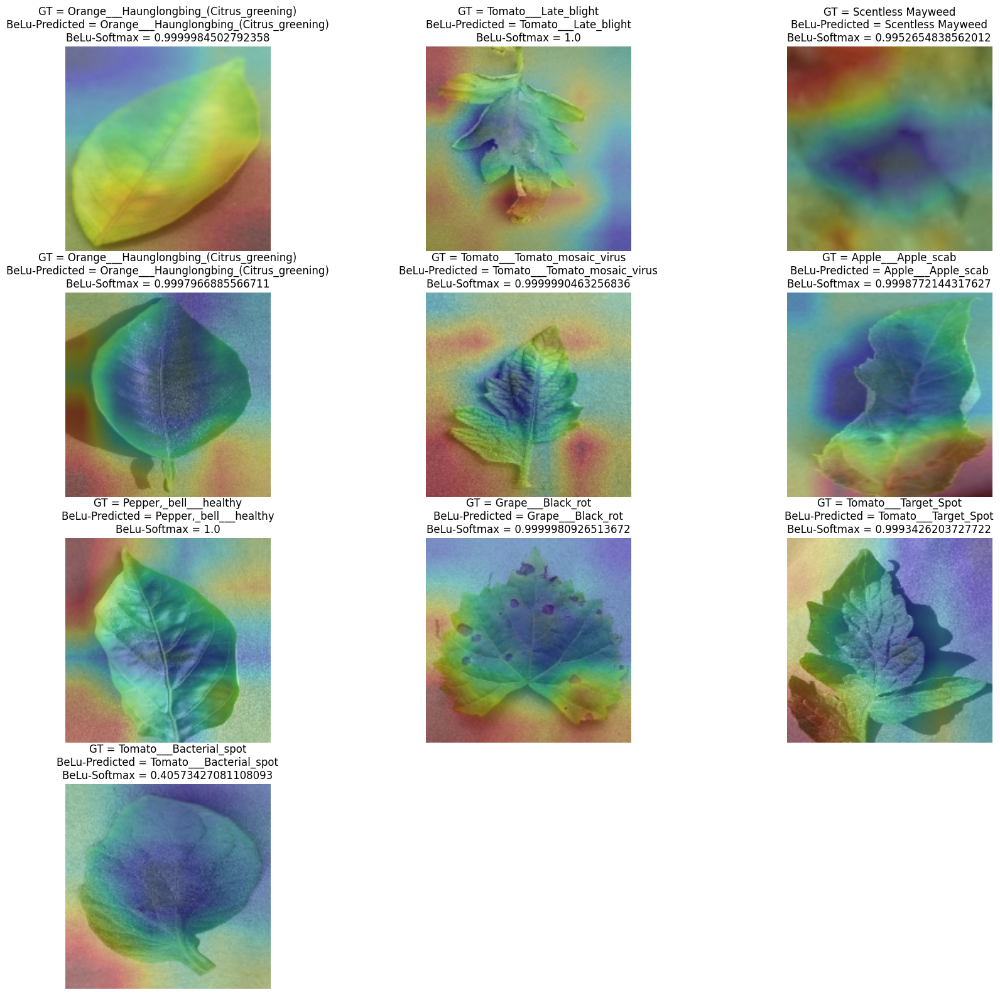

In [12]:
# predicts on the partition of the randomly chosen 1st batch of the test & validation data, 
# and plots the grid of overlayed Grad-CAMs images with performance details shown in titles

n_cols_sbplt = np.minimum(int(np.sqrt(batch_size)),3)
n_rows_sbplt = int(batch_size/n_cols_sbplt)
n_sbplts = int(n_rows_sbplt * n_cols_sbplt /3)
i_sbplt = 1
# n_trues = int(n_sbplts * 0.7)
# c_trues = 0
# acc_test_BeLu = 0.97
# boost_fct = 4
n_btchs = 1 # for other than exceptionally well performing models: boost_fct * int((n_sbplts - n_trues)/(1 - acc_test_BeLu)/batch_size + 1)

model_BeLu.layers[-1].activation = tf.keras.activations.softmax
test_val_ds_unbtch = test_val_ds.shuffle(n_btch, reshuffle_each_iteration=False).take(n_btchs).\
  map(lambda img, lbl: (img, lbl, model_BeLu(img, training=False)), num_parallel_calls=buffer_size).unbatch()

plt.figure(figsize=(7*n_cols_sbplt, 5*n_rows_sbplt))

while i_sbplt <= n_sbplts:
  img, lbl, pr_lbl_BeLu = next(iter(test_val_ds_unbtch))
  img = tf.expand_dims(img, axis=0)
  pred_lbl_BeLu = np.argmax(pr_lbl_BeLu.numpy(), axis = -1)
  pred_max_BeLu = pr_lbl_BeLu.numpy()[pred_lbl_BeLu]
  GT_idx = lbl.numpy()
  # for other than best models:
  #if (GT_idx == pred_lbl_BeLu):
  #  if c_trues == n_trues:
  #    continue
  #  c_trues +=1
  plt.subplot(n_rows_sbplt,n_cols_sbplt, i_sbplt)
  plt.title(f"GT = {class_names[GT_idx]}\nBeLu-Predicted = {class_names[pred_lbl_BeLu]}\nBeLu-Softmax = {pred_max_BeLu}")
  plt.imshow(tf.squeeze(img)/255., interpolation="bilinear", alpha = 0.9)
  plt.imshow(tf.image.resize(
    tf.expand_dims(tf.convert_to_tensor(make_gradcam_heatmap(img, model_BeLu, LAST_2D_LAYER_NAME_BeLu)), axis = -1),
    size = image_size,
    ), interpolation="bilinear", cmap = "jet", alpha = 0.3)
  plt.axis("off")
  if GT_idx != pred_lbl_BeLu:
    plt.gca().add_patch(patches.Rectangle((0, 0), 180, 180, linewidth=3, ls = '-', edgecolor='r', facecolor='none'))
  i_sbplt +=1
  print("|" if (i_sbplt - 1) % 5 == 0 else ".", end = "_")

plt.show();plt.close();

._._._._|_._._._._|_

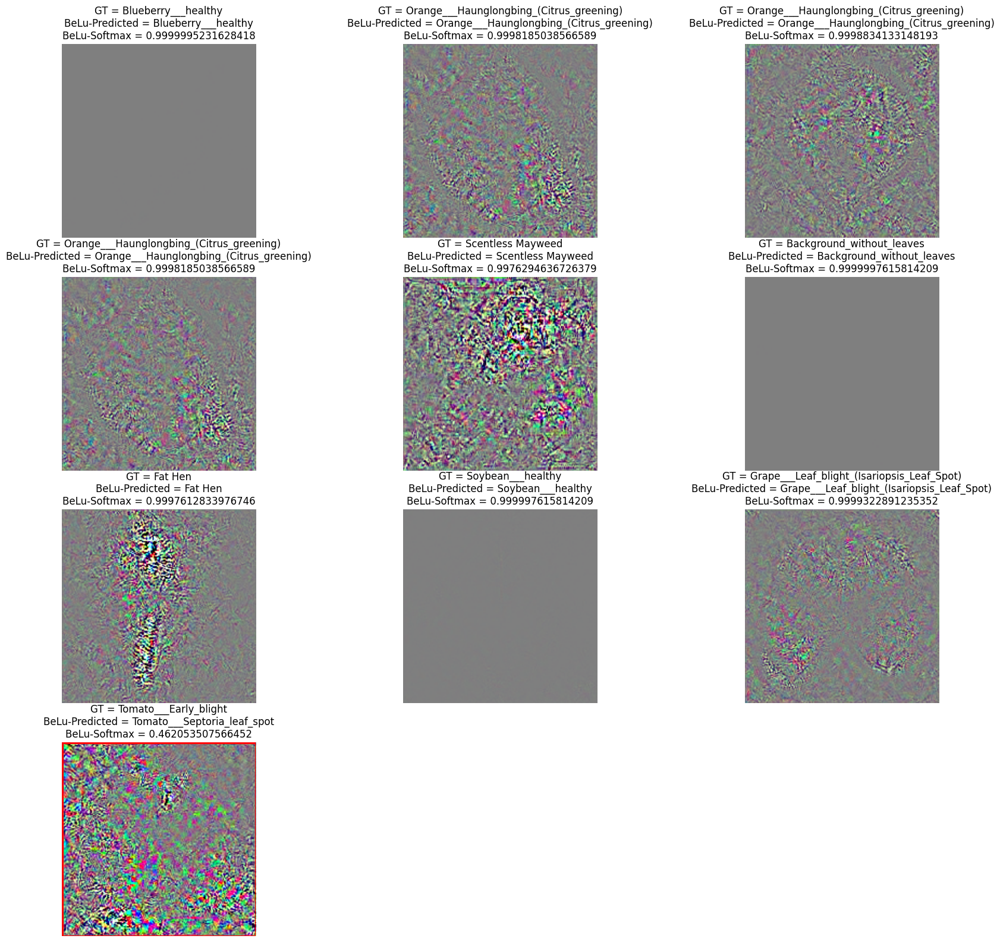

In [18]:
# predicts on the partition of the randomly chosen 1st batch of the test & validation data, 
# and plots the grid of Guided Grad-CAMs of images with performance details shown in titles

n_cols_sbplt = np.minimum(int(np.sqrt(batch_size)),3)
n_rows_sbplt = int(batch_size/n_cols_sbplt)
n_sbplts = int(n_rows_sbplt * n_cols_sbplt /3)
i_sbplt = 1
# n_trues = int(n_sbplts * 0.7)
# c_trues = 0
# acc_test_BeLu = 0.97
# boost_fct = 4
n_btchs = 1 # for other than exceptionally well performing models: boost_fct * int((n_sbplts - n_trues)/(1 - acc_test_BeLu)/batch_size + 1)

model_BeLu.layers[-1].activation = tf.keras.activations.softmax
test_val_ds_unbtch = test_val_ds.shuffle(n_btch, reshuffle_each_iteration=False).take(n_btchs).\
  map(lambda img, lbl: (img, lbl, model_BeLu(img, training=False)), num_parallel_calls=buffer_size).unbatch()

plt.figure(figsize=(7*n_cols_sbplt, 5*n_rows_sbplt))

while i_sbplt <= n_sbplts:
  img, lbl, pr_lbl_BeLu = next(iter(test_val_ds_unbtch))
  img = tf.expand_dims(img, axis=0)
  pred_lbl_BeLu = np.argmax(pr_lbl_BeLu.numpy(), axis = -1)
  pred_max_BeLu = pr_lbl_BeLu.numpy()[pred_lbl_BeLu]
  GT_idx = lbl.numpy()
  # for other than best models:
  #if (GT_idx == pred_lbl_BeLu):
  #  if c_trues == n_trues:
  #    continue
  #  c_trues +=1
  plt.subplot(n_rows_sbplt,n_cols_sbplt, i_sbplt)
  plt.title(f"GT = {class_names[GT_idx]}\nBeLu-Predicted = {class_names[pred_lbl_BeLu]}\nBeLu-Softmax = {pred_max_BeLu}")
  model_BeLu.layers[-1].activation = tf.keras.activations.softmax
  plt.imshow(np.squeeze(get_guided_gradcam(img, GT_idx, model_BeLu, LAST_2D_LAYER_NAME_BeLu)), interpolation="bilinear")
  plt.axis("off")
  if GT_idx != pred_lbl_BeLu:
    plt.gca().add_patch(patches.Rectangle((0, 0), 180, 180, linewidth=3, ls = '-', edgecolor='r', facecolor='none'))
  i_sbplt +=1
  print("|" if (i_sbplt - 1) % 5 == 0 else ".", end = "_")

plt.show();plt.close();

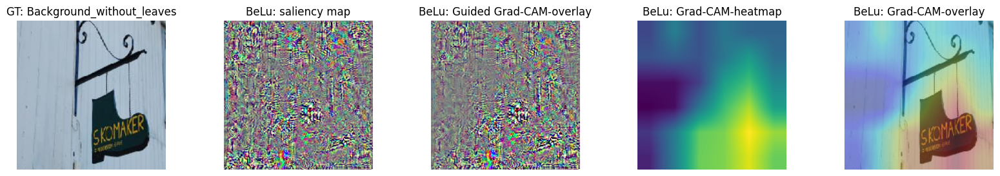

In [29]:
# computing and displaying the full stack of analysis units for the visual interpretability on the example of a target image

cls_names = ['Apple___Apple_scab',
 'Apple___Black_rot',
 'Apple___Cedar_apple_rust',
 'Apple___healthy',
 'Background_without_leaves',
 'Black-grass',
 'Blueberry___healthy',
 'Charlock',
 'Cherry___Powdery_mildew',
 'Cherry___healthy',
 'Cleavers',
 'Common Chickweed',
 'Common wheat',
 'Corn___Cercospora_leaf_spot Gray_leaf_spot',
 'Corn___Common_rust',
 'Corn___Northern_Leaf_Blight',
 'Corn___healthy',
 'Fat Hen',
 'Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Grape___healthy',
 'Loose Silky-bent',
 'Maize',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Peach___Bacterial_spot',
 'Peach___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Pepper,_bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy',
 'Raspberry___healthy',
 'Scentless Mayweed',
 'Shepherds Purse',
 'Small-flowered Cranesbill',
 'Soybean___healthy',
 'Squash___Powdery_mildew',
 'Strawberry___Leaf_scorch',
 'Strawberry___healthy',
 'Sugar beet',
 'Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spider_mites Two-spotted_spider_mite',
 'Tomato___Target_Spot',
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 'Tomato___Tomato_mosaic_virus',
 'Tomato___healthy']

# path to a representative image of PlantVillage dataset class 'Background_without_leaves':
img_path_bckgrnd = os.path.join(dataset_dir,"Background_without_leaves", "image (159).jpg")

LAST_2D_LAYER_NAME_BeLu = 'mobilenetv2_1.00_224'
input_shape = image_size + (3,)
img_path = img_path_bckgrnd # TODO: assign a path to the target image of the dataset & you are ready to go
img_lbl = np.where(np.array(cls_names) == img_path.split('\\')[-2].strip())[0][0]
img_cls = cls_names[img_lbl]
#----------------------------------------------------------------------------
img = image.load_img(img_path, 
                     target_size=image_size,
                     keep_aspect_ratio=False)
img_arr = image.img_to_array(img)
img = tf.expand_dims(img_arr, axis=0)
#----------------------------------------------------------------------------
plt.figure(figsize=(4*5, 3*1))
plt.subplot(151)
plt.axis("off")
plt.imshow(tf.squeeze(img)/255., interpolation="bilinear")
plt.title(f"GT: {img_cls}")
plt.subplot(152)
plt.axis("off")
model_BeLu.layers[-1].activation = tf.keras.activations.softmax
plt.imshow(get_saliency_map(img, img_lbl, model_BeLu), interpolation="bilinear")
plt.title("BeLu: saliency map")
plt.subplot(153)
plt.axis("off")
model_BeLu.layers[-1].activation = tf.keras.activations.softmax
plt.imshow(np.squeeze(get_guided_gradcam(img, img_lbl, model_BeLu, LAST_2D_LAYER_NAME_BeLu)), interpolation="bilinear")
plt.title("BeLu: Guided Grad-CAM-overlay")
plt.subplot(154)
plt.axis("off")
plt.imshow(tf.image.resize(
    tf.expand_dims(tf.convert_to_tensor(make_gradcam_heatmap(img, model_BeLu, LAST_2D_LAYER_NAME_BeLu)), axis = -1),
    size = image_size,
    ), interpolation="bilinear")
plt.title("BeLu: Grad-CAM-heatmap")
plt.subplot(155)
plt.axis("off")
plt.imshow(tf.squeeze(img)/255., interpolation="bilinear", alpha = 0.9)
plt.imshow(tf.image.resize(
    tf.expand_dims(tf.convert_to_tensor(make_gradcam_heatmap(img, model_BeLu, LAST_2D_LAYER_NAME_BeLu)), axis = -1),
    size = image_size,
    ), interpolation="bilinear", cmap = "jet", alpha = 0.3)
plt.title("BeLu: Grad-CAM-overlay")

plt.show();plt.close();

***